In [1]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 61.8 MB/s eta 0:00:00


In [2]:
from IPython.display import clear_output
clear_output()
import ultralytics
ultralytics.checks()

Ultralytics 8.3.151 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6361.9/8062.4 GB disk)


In [ ]:
import torch
print(torch.cuda.is_available())  
print(torch.cuda.device_count())  
print(torch.cuda.get_device_name(0)) 

True
2
Tesla T4


In [4]:
import os
import shutil

# Đường dẫn gốc và đích
src = "/kaggle/input/face-detection-dataset"
dst = "/kaggle/working/face-detection-dataset"

# Copy toàn bộ thư mục dữ liệu
shutil.copytree(src, dst, dirs_exist_ok=True)
print(f"Dữ liệu đã được sao chép vào: {dst}")

Dữ liệu đã được sao chép vào: /kaggle/working/face-detection-dataset


In [ ]:
data_yaml = """
path: /kaggle/working/face-detection-dataset
train: images/train
val: images/val

nc: 1  
names: ['face']  
"""

with open("/kaggle/working/face_data.yaml", "w") as f:
    f.write(data_yaml.strip())

In [6]:
from ultralytics import YOLO
model = YOLO("yolov8n.yaml")  

# Train
model.train(
data="/kaggle/working/face_data.yaml",
epochs=30,
imgsz=640,
batch=16,
device=0)

Ultralytics 8.3.151 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/face_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretraine

100%|██████████| 755k/755k [00:00<00:00, 20.7MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 100MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1801.3±945.3 MB/s, size: 229.5 KB)


train: Scanning /kaggle/working/face-detection-dataset/labels/train... 13386 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13386/13386 [00:09<00:00, 1484.00it/s]


train: New cache created: /kaggle/working/face-detection-dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 558.2±96.0 MB/s, size: 308.9 KB)


val: Scanning /kaggle/working/face-detection-dataset/labels/val... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:02<00:00, 1409.79it/s]


val: New cache created: /kaggle/working/face-detection-dataset/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      3.15G      2.571      2.633      2.655         50        640: 100%|██████████| 837/837 [02:36<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:22<00:00,  4.72it/s]


                   all       3347      10299      0.754      0.455      0.528      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      3.81G      1.724      1.433      1.658         30        640: 100%|██████████| 837/837 [02:34<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  4.99it/s]


                   all       3347      10299       0.81      0.586      0.663      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.18G      1.572      1.204      1.507         49        640: 100%|██████████| 837/837 [02:34<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.10it/s]


                   all       3347      10299      0.849      0.621      0.709      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.19G      1.492      1.096      1.436         48        640: 100%|██████████| 837/837 [02:34<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.08it/s]


                   all       3347      10299      0.848       0.64      0.729      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       4.2G      1.435      1.016      1.388         55        640: 100%|██████████| 837/837 [02:33<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.03it/s]


                   all       3347      10299      0.875      0.668      0.757      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.22G      1.402     0.9637      1.357         32        640: 100%|██████████| 837/837 [02:33<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.06it/s]


                   all       3347      10299       0.88      0.692      0.779      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.24G      1.377     0.9261      1.339         47        640: 100%|██████████| 837/837 [02:33<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.06it/s]


                   all       3347      10299      0.881      0.709      0.794      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.26G       1.36     0.9064      1.323         58        640: 100%|██████████| 837/837 [02:35<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.13it/s]


                   all       3347      10299      0.864      0.724        0.8      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.26G      1.329     0.8701      1.305         39        640: 100%|██████████| 837/837 [02:33<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  4.98it/s]


                   all       3347      10299      0.881      0.721      0.803      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.29G      1.316     0.8433      1.291         49        640: 100%|██████████| 837/837 [02:35<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.12it/s]


                   all       3347      10299      0.884       0.73      0.814       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.31G      1.303     0.8327      1.281         46        640: 100%|██████████| 837/837 [02:31<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.05it/s]


                   all       3347      10299      0.892      0.733      0.814      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.32G      1.289      0.819       1.27         35        640: 100%|██████████| 837/837 [02:31<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.13it/s]


                   all       3347      10299      0.884      0.742      0.821      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.33G       1.28     0.7967      1.262         64        640: 100%|██████████| 837/837 [02:33<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.15it/s]


                   all       3347      10299      0.879      0.747      0.822      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.36G      1.268     0.7919      1.249         39        640: 100%|██████████| 837/837 [02:33<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.19it/s]


                   all       3347      10299      0.886      0.751      0.829      0.537

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.37G      1.261     0.7768      1.248        123        640: 100%|██████████| 837/837 [02:32<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.07it/s]


                   all       3347      10299      0.882      0.759      0.831      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.39G      1.257     0.7659      1.242         31        640: 100%|██████████| 837/837 [02:33<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.05it/s]


                   all       3347      10299      0.887      0.756      0.835      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       4.4G      1.247     0.7546      1.237         70        640: 100%|██████████| 837/837 [02:33<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.13it/s]


                   all       3347      10299      0.888      0.757      0.836      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.42G      1.243     0.7457      1.231         77        640: 100%|██████████| 837/837 [02:34<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.09it/s]


                   all       3347      10299      0.885      0.765       0.84      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      4.44G      1.233     0.7381      1.222         77        640: 100%|██████████| 837/837 [02:33<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  5.00it/s]


                   all       3347      10299      0.889      0.767      0.842       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.46G      1.218     0.7214      1.215         49        640: 100%|██████████| 837/837 [02:33<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:19<00:00,  5.26it/s]


                   all       3347      10299      0.887      0.768      0.841      0.552
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      4.46G      1.199     0.6709      1.204         30        640: 100%|██████████| 837/837 [02:30<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.18it/s]


                   all       3347      10299      0.895      0.763      0.842      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      4.49G      1.187      0.658      1.199         20        640: 100%|██████████| 837/837 [02:29<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.05it/s]


                   all       3347      10299      0.902      0.763      0.843      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      4.51G       1.18      0.646      1.194         26        640: 100%|██████████| 837/837 [02:29<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.07it/s]


                   all       3347      10299      0.902      0.761      0.845      0.557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.53G      1.174     0.6399       1.19         31        640: 100%|██████████| 837/837 [02:28<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.07it/s]


                   all       3347      10299      0.893      0.773      0.848      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      4.53G      1.171     0.6308      1.185         28        640: 100%|██████████| 837/837 [02:29<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  4.94it/s]


                   all       3347      10299      0.888      0.782       0.85      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      4.56G      1.163     0.6218      1.183         34        640: 100%|██████████| 837/837 [02:29<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  4.99it/s]


                   all       3347      10299       0.89      0.779      0.851      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      4.58G      1.158     0.6122      1.177         24        640: 100%|██████████| 837/837 [02:29<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.03it/s]


                   all       3347      10299      0.895      0.776      0.853      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      4.59G      1.152     0.6039      1.176         21        640: 100%|██████████| 837/837 [02:29<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:20<00:00,  5.02it/s]


                   all       3347      10299      0.894      0.781      0.855      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       4.6G      1.144     0.6014      1.168         29        640: 100%|██████████| 837/837 [02:30<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  4.87it/s]


                   all       3347      10299      0.896      0.776      0.854      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      4.63G      1.139     0.5919      1.166         37        640: 100%|██████████| 837/837 [02:29<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:21<00:00,  4.99it/s]


                   all       3347      10299      0.894       0.78      0.856      0.565

30 epochs completed in 1.448 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:22<00:00,  4.65it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       3347      10299      0.894       0.78      0.856      0.565
Speed: 0.1ms preprocess, 1.6ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c18d616d990>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [7]:
metrics = model.val()
metrics

Ultralytics 8.3.151 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2330.1±608.2 MB/s, size: 134.1 KB)


val: Scanning /kaggle/working/face-detection-dataset/labels/val.cache... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 210/210 [00:24<00:00,  8.63it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       3347      10299      0.895       0.78      0.856      0.565
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c18d479a390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [8]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

In [9]:
val_dir = "/kaggle/input/face-detection-dataset/images/val"
image_files = [os.path.join(val_dir, f) for f in os.listdir(val_dir) if f.endswith(('.jpg', '.png'))]

random_images = random.sample(image_files, 30)  # chọn ngẫu nhiên 30 ảnh


image 1/1 /kaggle/input/face-detection-dataset/images/val/d9791dd278d2c80f.jpg: 448x640 2 faces, 39.2ms
Speed: 3.7ms preprocess, 39.2ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


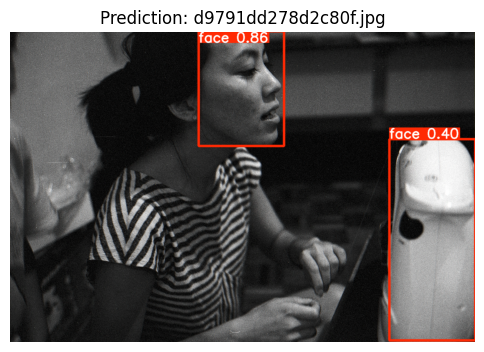


image 1/1 /kaggle/input/face-detection-dataset/images/val/8aaf22f24445b5ef.jpg: 448x640 6 faces, 10.2ms
Speed: 4.2ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


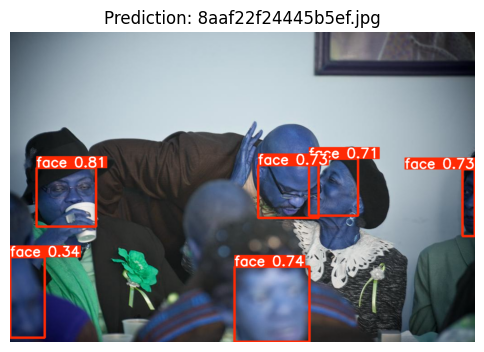


image 1/1 /kaggle/input/face-detection-dataset/images/val/45d3f477012b1f2c.jpg: 640x640 (no detections), 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


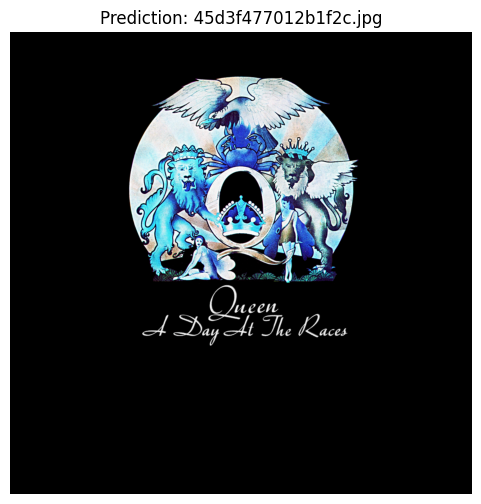


image 1/1 /kaggle/input/face-detection-dataset/images/val/f81a3d308a5caf27.jpg: 480x640 9 faces, 36.7ms
Speed: 2.2ms preprocess, 36.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


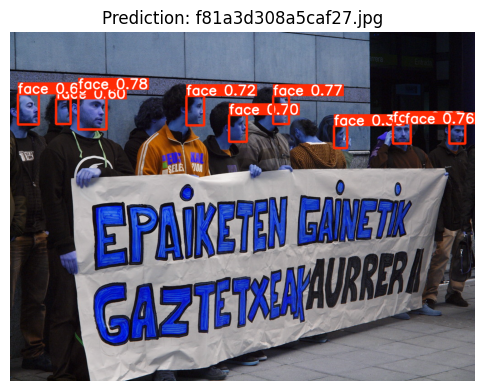


image 1/1 /kaggle/input/face-detection-dataset/images/val/96cb996f60c3e078.jpg: 448x640 1 face, 7.2ms
Speed: 2.0ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


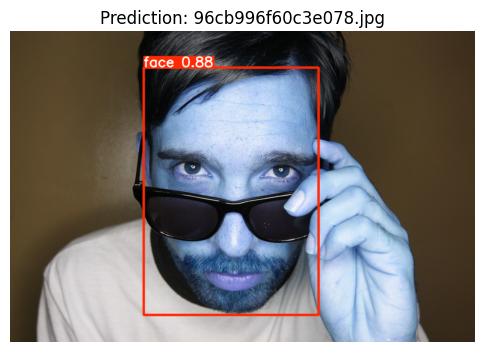


image 1/1 /kaggle/input/face-detection-dataset/images/val/2962b320b6259fbe.jpg: 448x640 1 face, 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


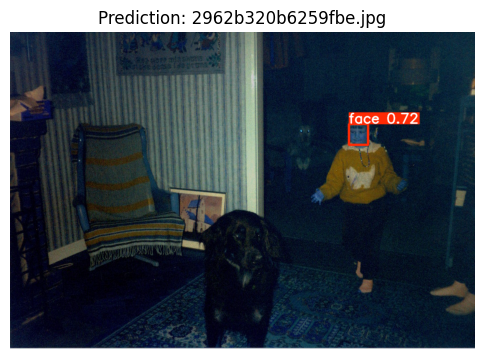


image 1/1 /kaggle/input/face-detection-dataset/images/val/d15ae249283b8185.jpg: 448x640 7 faces, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


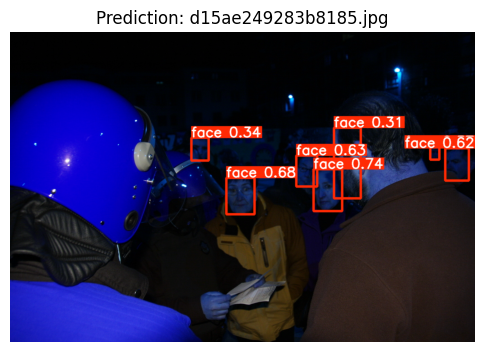


image 1/1 /kaggle/input/face-detection-dataset/images/val/353807dfa2f48aad.jpg: 448x640 2 faces, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


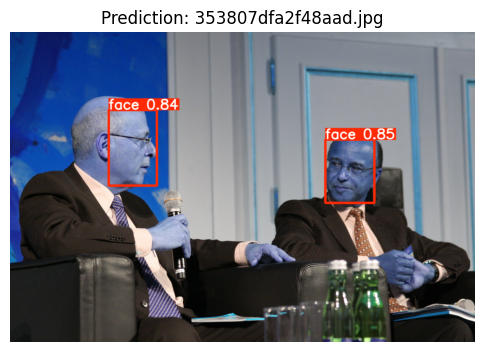


image 1/1 /kaggle/input/face-detection-dataset/images/val/d7085ecab597665a.jpg: 448x640 3 faces, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


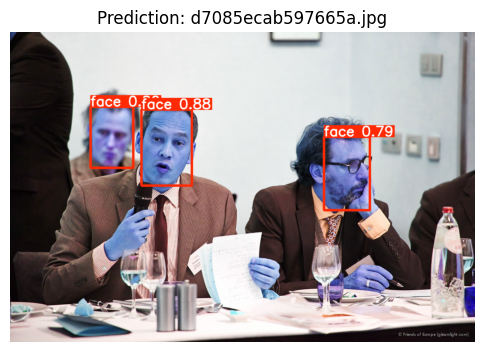


image 1/1 /kaggle/input/face-detection-dataset/images/val/d9f700e76956b691.jpg: 640x480 4 faces, 33.9ms
Speed: 2.2ms preprocess, 33.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


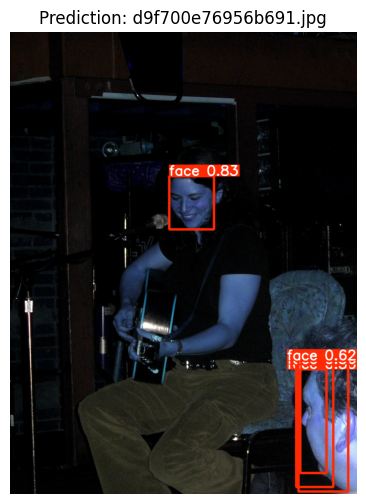


image 1/1 /kaggle/input/face-detection-dataset/images/val/e9e067c023830e53.jpg: 480x640 3 faces, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


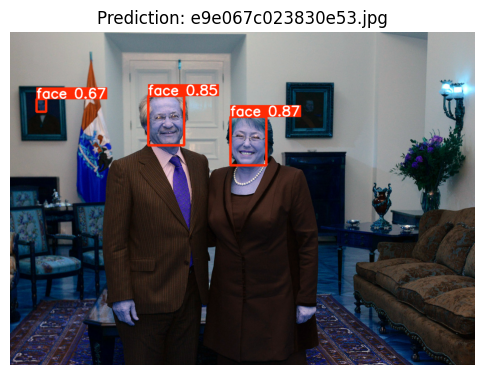


image 1/1 /kaggle/input/face-detection-dataset/images/val/4f0926c259911b04.jpg: 448x640 2 faces, 7.2ms
Speed: 2.1ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


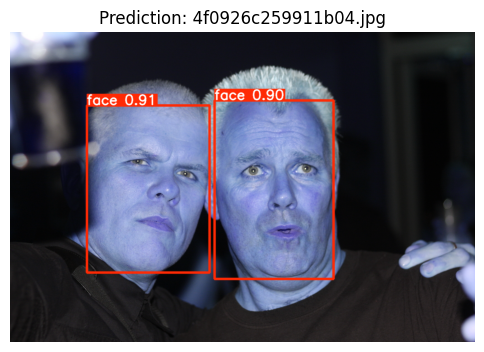


image 1/1 /kaggle/input/face-detection-dataset/images/val/11a662de11921d66.jpg: 448x640 9 faces, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


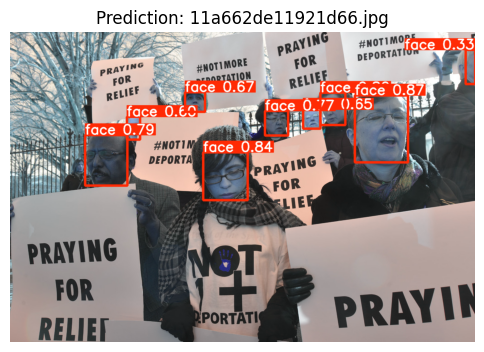


image 1/1 /kaggle/input/face-detection-dataset/images/val/5f2841818b7faef8.jpg: 448x640 1 face, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


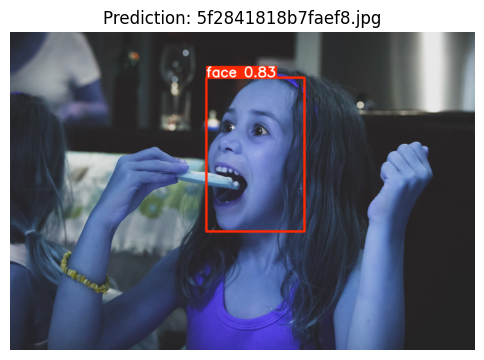


image 1/1 /kaggle/input/face-detection-dataset/images/val/c6e7e17236e1780a.jpg: 640x640 1 face, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


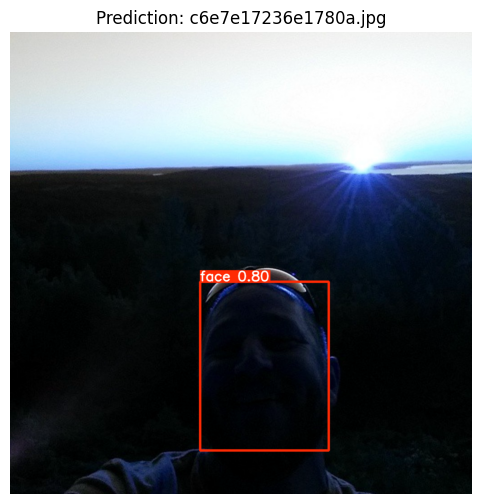


image 1/1 /kaggle/input/face-detection-dataset/images/val/18a887caeec087a3.jpg: 480x640 3 faces, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


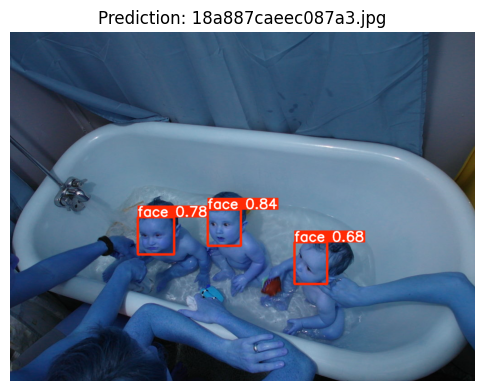


image 1/1 /kaggle/input/face-detection-dataset/images/val/5ab6a254eec961a8.jpg: 448x640 2 faces, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


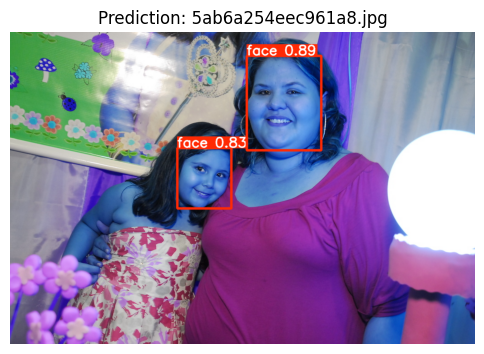


image 1/1 /kaggle/input/face-detection-dataset/images/val/c8c176bccf323bda.jpg: 640x576 1 face, 34.5ms
Speed: 2.6ms preprocess, 34.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 576)


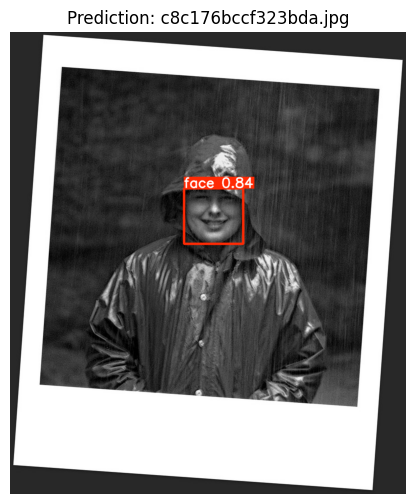


image 1/1 /kaggle/input/face-detection-dataset/images/val/204fbc1bb05ba8a0.jpg: 448x640 6 faces, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


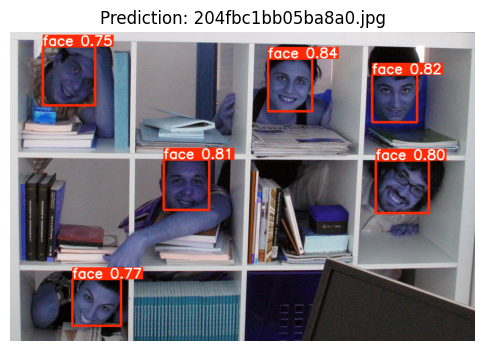


image 1/1 /kaggle/input/face-detection-dataset/images/val/4f43e7c70ea26881.jpg: 448x640 2 faces, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


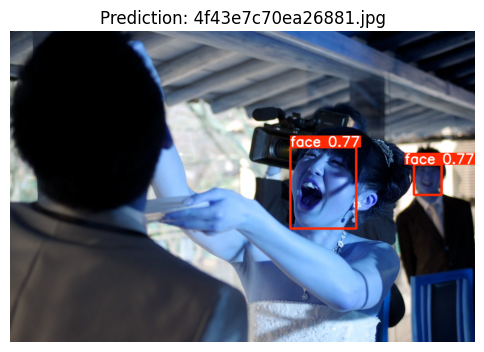


image 1/1 /kaggle/input/face-detection-dataset/images/val/b7800bfe95c1e6c3.jpg: 640x480 18 faces, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


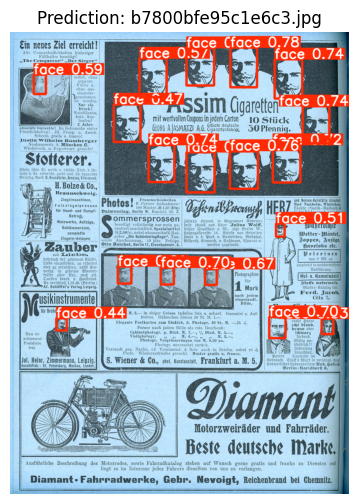


image 1/1 /kaggle/input/face-detection-dataset/images/val/c1b663fae5e113fe.jpg: 480x640 4 faces, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


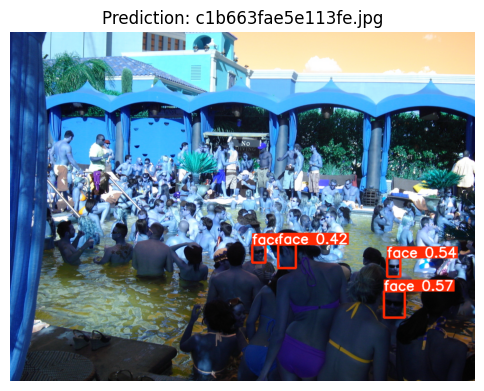


image 1/1 /kaggle/input/face-detection-dataset/images/val/4fcda6332c216095.jpg: 480x640 1 face, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


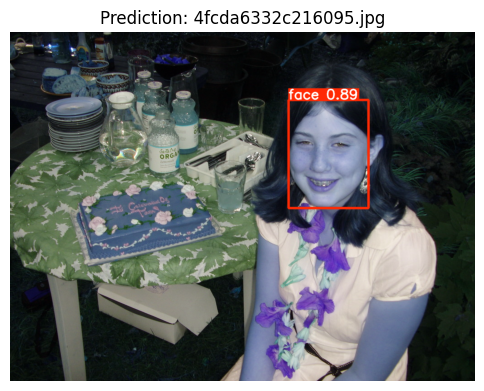


image 1/1 /kaggle/input/face-detection-dataset/images/val/7b03b3b73893b162.jpg: 480x640 1 face, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


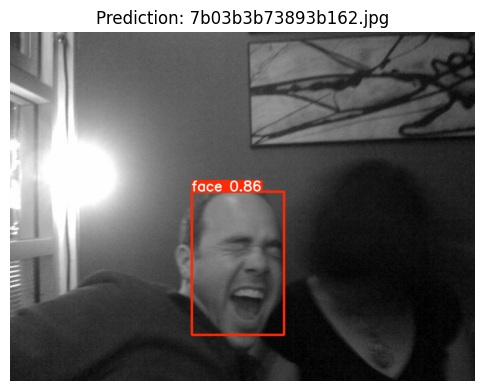


image 1/1 /kaggle/input/face-detection-dataset/images/val/8da960a1261f724a.jpg: 480x640 2 faces, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


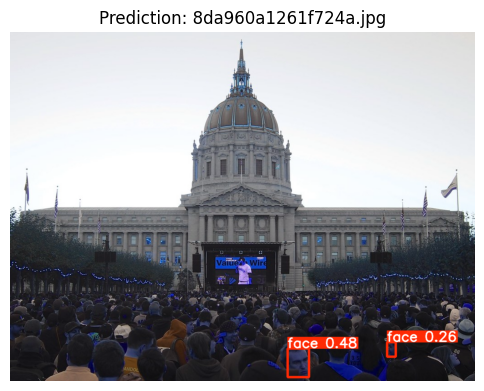


image 1/1 /kaggle/input/face-detection-dataset/images/val/e1772e70b3dca0e7.jpg: 448x640 2 faces, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


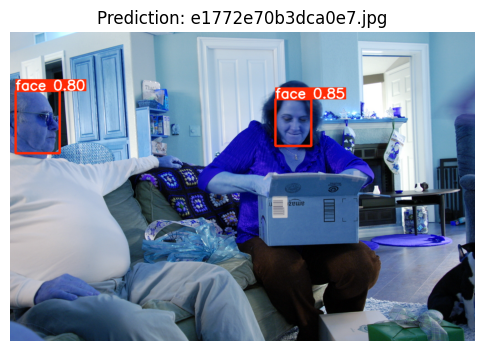


image 1/1 /kaggle/input/face-detection-dataset/images/val/4f6c162f32994830.jpg: 384x640 1 face, 34.9ms
Speed: 2.3ms preprocess, 34.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


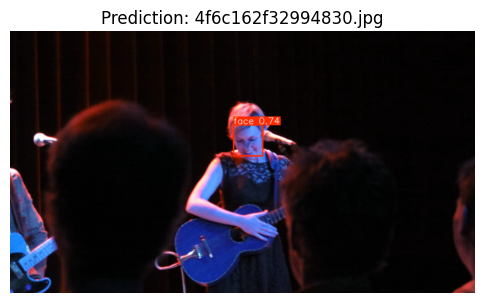


image 1/1 /kaggle/input/face-detection-dataset/images/val/2b2aa1d14742ffea.jpg: 448x640 1 face, 7.0ms
Speed: 1.9ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


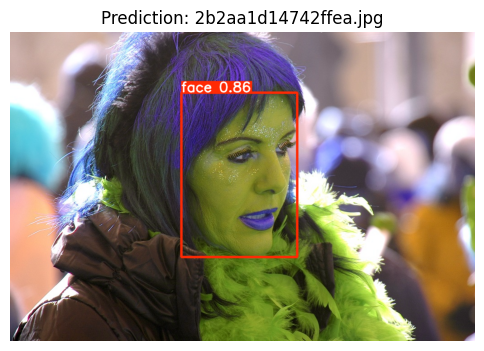


image 1/1 /kaggle/input/face-detection-dataset/images/val/82562644357ac3c9.jpg: 640x448 1 face, 34.1ms
Speed: 2.1ms preprocess, 34.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 448)


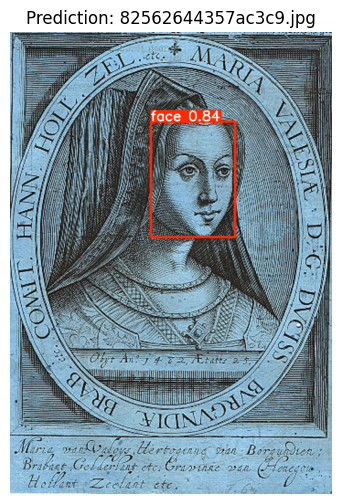


image 1/1 /kaggle/input/face-detection-dataset/images/val/77cfa35c9ae4fd62.jpg: 544x640 3 faces, 33.7ms
Speed: 2.3ms preprocess, 33.7ms inference, 1.5ms postprocess per image at shape (1, 3, 544, 640)


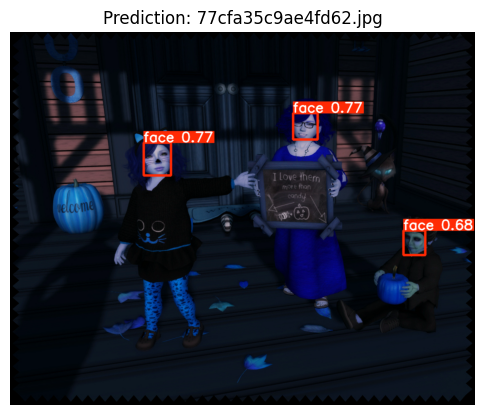

In [ ]:
for img_path in random_images:
    results = model.predict(source=img_path, save=False, show=False, conf=0.25)
    for result in results:
        img = Image.fromarray(result.plot()) 
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.title(f"Prediction: {os.path.basename(img_path)}")
        plt.axis('off')
        plt.show()